In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

from plotly.offline import iplot
import plotly as py
import plotly.tools as tls
import cufflinks as cf
py.offline.init_notebook_mode(connected=True) 
cf.go_offline()

In [2]:
po=pd.read_csv(r"C:\Users\shaik\Downloads\all_india_PO_list_without_APS_offices_ver2_lat_long.csv")
po.head()

,officename,pincode,officeType,Deliverystatus,divisionname,regionname,circlename,Taluk,Districtname,statename,Telephone,Related Suboffice,Related Headoffice,longitude,latitude
0,Achalapur B.O,504273,B.O,Delivery,Adilabad,Hyderabad,Andhra Pradesh,Asifabad,Adilabad,TELANGANA,NaN,Rechini S.O,Mancherial H.O,NaN,NaN
1,Ada B.O,504293,B.O,Delivery,Adilabad,Hyderabad,Andhra Pradesh,Asifabad,Adilabad,TELANGANA,NaN,Asifabad S.O,Mancherial H.O,NaN,NaN
2,Adegaon B.O,504307,B.O,Delivery,Adilabad,Hyderabad,Andhra Pradesh,Boath,Adilabad,TELANGANA,NaN,Echoda S.O,Adilabad H.O,NaN,NaN
3,Adilabad Collectorate S.O,504001,S.O,Non-Delivery,Adilabad,Hyderabad,Andhra Pradesh,Adilabad,Adilabad,TELANGANA,08732-226703,NaN,Adilabad H.O,NaN,NaN
4,Adilabad H.O,504001,H.O,Delivery,Adilabad,Hyderabad,Andhra Pradesh,Adilabad,Adilabad,TELANGANA,08732-226738,NaN,NaN,NaN,NaN


In [3]:
po.shape

(154797, 15)

In [4]:
po.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 154797 entries, 0 to 154796
Data columns (total 15 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   officename          154797 non-null  object 
 1   pincode             154797 non-null  int64  
 2   officeType          154797 non-null  object 
 3   Deliverystatus      154797 non-null  object 
 4   divisionname        154797 non-null  object 
 5   regionname          154797 non-null  object 
 6   circlename          154797 non-null  object 
 7   Taluk               146488 non-null  object 
 8   Districtname        154761 non-null  object 
 9   statename           154761 non-null  object 
 10  Telephone           23418 non-null   object 
 11  Related Suboffice   125269 non-null  object 
 12  Related Headoffice  153987 non-null  object 
 13  longitude           142 non-null     float64
 14  latitude            142 non-null     float64
dtypes: float64(2), int64(1), object(12

In [5]:
po.describe()

,pincode,longitude,latitude
count,154797.000000,142.000000,142.000000
mean,501509.542892,77.024598,12.630815
std,207429.903676,0.547229,0.680159
min,110001.000000,75.992100,11.809700
25%,331403.000000,76.627625,12.302425
50%,504205.000000,76.787650,12.372400
75%,682313.000000,77.581425,12.953075
max,855117.000000,78.447500,17.471800


In [6]:
po.isnull().sum()

officename                 0
pincode                    0
officeType                 0
Deliverystatus             0
divisionname               0
regionname                 0
circlename                 0
Taluk                   8309
Districtname              36
statename                 36
Telephone             131379
Related Suboffice      29528
Related Headoffice       810
longitude             154655
latitude              154655
dtype: int64

<AxesSubplot:>

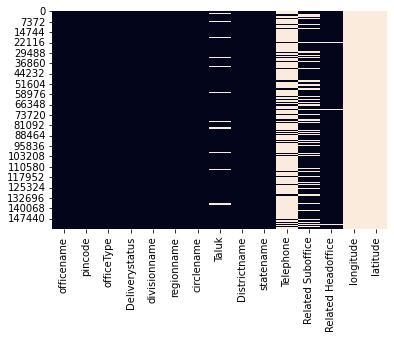

In [7]:
sns.heatmap(po.isnull(), cbar=False)

1. Nulls values are found in high amount.
2. There some unwanted columns which are not usefull for this analyis.  

In [8]:
po.columns

Index(['officename', 'pincode', 'officeType', 'Deliverystatus', 'divisionname',
       'regionname', 'circlename', 'Taluk', 'Districtname', 'statename',
       'Telephone', 'Related Suboffice', 'Related Headoffice', 'longitude',
       'latitude'],
      dtype='object')

In [9]:
del po['Taluk']
del po['Districtname']
del po['statename']
del po['Telephone']
del po['Related Suboffice']
del po['Related Headoffice']
del po['longitude']
del po['latitude']

1. Deleting the unwanted and null values columns

<AxesSubplot:>

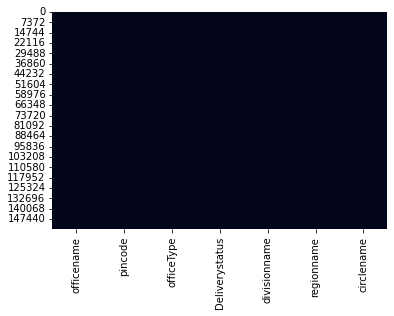

In [10]:
sns.heatmap(po.isnull(), cbar=False)

1. Removed all null values
2. Removed columns which are not imprtant for this analysis

In [11]:
po.head(20)

,officename,pincode,officeType,Deliverystatus,divisionname,regionname,circlename
0,Achalapur B.O,504273,B.O,Delivery,Adilabad,Hyderabad,Andhra Pradesh
1,Ada B.O,504293,B.O,Delivery,Adilabad,Hyderabad,Andhra Pradesh
2,Adegaon B.O,504307,B.O,Delivery,Adilabad,Hyderabad,Andhra Pradesh
3,Adilabad Collectorate S.O,504001,S.O,Non-Delivery,Adilabad,Hyderabad,Andhra Pradesh
4,Adilabad H.O,504001,H.O,Delivery,Adilabad,Hyderabad,Andhra Pradesh
5,Agm Colony S.O,504251,S.O,Non-Delivery,Adilabad,Hyderabad,Andhra Pradesh
6,Ainam B.O,504273,B.O,Delivery,Adilabad,Hyderabad,Andhra Pradesh
7,Aknepalli B.O,504251,B.O,Delivery,Adilabad,Hyderabad,Andhra Pradesh
8,Akoli B.O,504309,B.O,Delivery,Adilabad,Hyderabad,Andhra Pradesh
9,Alegaon B.O,504201,B.O,Delivery,Adilabad,Hyderabad,Andhra Pradesh


<AxesSubplot:ylabel='Frequency'>

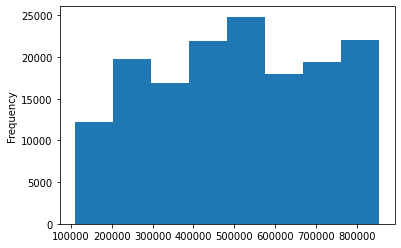

In [12]:
po.pincode.plot.hist(bins=8)

1. Above Histogram shows the frequency of pincode column.

In [13]:
po.pincode.value_counts().head(30).iplot(kind="box")

1. The above box plot shows the max and min value count of pincode column

In [14]:
po.officename.head(30).iplot(kind="bar")

1. The above bar plot shows top 30 officenames.

In [15]:
po.officename.value_counts().head(30).iplot(kind="bar")

1. The above bar plot shows top 30 value counts of officename's columns.

In [20]:
po.Deliverystatus.head(10).iplot(kind="bar")

1. The above bar plot shows top 10 Delivery status

In [43]:
po.iplot(kind='scatter', x = 'pincode', y = 'circlename')

1. The above scatter plot shows the column called pin code erf to circle name

In [52]:
po.head(10).iplot(kind='hist', bins = 10, barmode = 'group', bargap=0.5)

1. The above Histogram plot shows a group gharph all columns